# Decision Tree
## What is a Decision Tree?
- Decision Tree is a Supervised learning technique that can be used for both classification and Regression problems, but mostly it is preferred for **solving Classification problems**. 
- It is a **tree-structured classifier**, where internal nodes represent the features of a dataset, branches represent the decision rules and each leaf node represents the outcome.
- In a Decision tree, there are three nodes, which are the **Root node,Decision Node and Leaf Node**. 
- **Decision nodes** are used to make any decision and have multiple branches, whereas **Leaf nodes** are the output of those decisions and do not contain any further branches.
- The decisions or the test are performed on the basis of features of the given dataset.
- It is a graphical representation for getting all the possible solutions to a problem/decision based on given conditions.
- It is called a decision tree because, similar to a tree, it starts with the root node, which expands on further branches and constructs a tree-like structure.
- In order to build a tree, we use the **CART algorithm, which stands for Classification and Regression Tree algorithm**.
- A decision tree simply asks a question, and based on the answer (Yes/No), it further split the tree into subtrees.

### About the data: 
Let’s consider a Company dataset with around 10 variables and 400 records. 

The attributes are as follows: 

- **Sales** -- Unit sales (in thousands) at each location
- **Competitor Price** -- Price charged by competitor at each location
- **Income** -- Community income level (in thousands of dollars)
- **Advertising** -- Local advertising budget for company at each location (in thousands of dollars)
- **Population** -- Population size in region (in thousands)
- **Price** -- Price company charges for car seats at each site
- **Shelf Location at stores** -- A factor with levels Bad, Good and Medium indicating the quality of the shelving location for the car seats at each site
- **Age** -- Average age of the local population
- **Education** -- Education level at each location
- **Urban** -- A factor with levels No and Yes to indicate whether the store is in an urban or rural location
- **US** -- A factor with levels No and Yes to indicate whether the store is in the US or not


### Problem Statement:
- A cloth manufacturing company is interested to know about the segment or attributes causes high sale. 

**Approach** - A decision tree can be built with target variable Sale (we will first convert it in categorical variable) & all other variable will be independent in the analysis.  


In [1]:
# Importing libraries 
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn

from sklearn import preprocessing
from dataprep.eda import plot, plot_correlation, plot_missing, create_report


from sklearn.tree import  DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report,confusion_matrix,accuracy_score, roc_auc_score, roc_curve, precision_recall_curve
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score, train_test_split, RandomizedSearchCV


import warnings
warnings.filterwarnings('ignore')

In [2]:
data=pd.read_csv('Company_Data.csv')
data

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes


## Exploratory data Analysis

In [3]:
data.duplicated().sum()

0

We can se that there is no outliers present iin data.

In [4]:
data.describe()

,Sales,CompPrice,Income,Advertising,Population,Price,Age,Education
count,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000
mean,7.496325,124.975000,68.657500,6.635000,264.840000,115.795000,53.322500,13.900000
std,2.824115,15.334512,27.986037,6.650364,147.376436,23.676664,16.200297,2.620528
min,0.000000,77.000000,21.000000,0.000000,10.000000,24.000000,25.000000,10.000000
25%,5.390000,115.000000,42.750000,0.000000,139.000000,100.000000,39.750000,12.000000
50%,7.490000,125.000000,69.000000,5.000000,272.000000,117.000000,54.500000,14.000000
75%,9.320000,135.000000,91.000000,12.000000,398.500000,131.000000,66.000000,16.000000
max,16.270000,175.000000,120.000000,29.000000,509.000000,191.000000,80.000000,18.000000


From above table we get values of numerical features.
- we can say that there is some outliers in data .because the diff between Q3 and max value is more.

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Sales        400 non-null    float64
 1   CompPrice    400 non-null    int64  
 2   Income       400 non-null    int64  
 3   Advertising  400 non-null    int64  
 4   Population   400 non-null    int64  
 5   Price        400 non-null    int64  
 6   ShelveLoc    400 non-null    object 
 7   Age          400 non-null    int64  
 8   Education    400 non-null    int64  
 9   Urban        400 non-null    object 
 10  US           400 non-null    object 
dtypes: float64(1), int64(7), object(3)
memory usage: 34.5+ KB


- The shape of data is(400Rx11C)
- There are no missing values in data.
- There are 7 numerical features and 3 categorical features.

### Feature Engineering

#### For Target Variable (Sales)

In [6]:
data.Sales.describe()

count    400.000000
mean       7.496325
std        2.824115
min        0.000000
25%        5.390000
50%        7.490000
75%        9.320000
max       16.270000
Name: Sales, dtype: float64

In [2]:
df=data.copy()
plt.hist('Sales',data=df)

NameError: name 'data' is not defined

**We can see in the above plot the sales column data is normally distributed.**

Now,we can take mean or median as a threshold to make two or three categories **'Low', 'Medium' and 'High' Sales**
- For three categories lets divide the Sales values with Quartiles , less than first quartile as 'Low' , between Second Quartile as 'Medium and above Third Quartile as 'High'.

In [105]:
# We make category fom describe table .
df['Sales_cat']=pd.cut(x=df['Sales'],bins=[-1,5.39,9.32,17], labels=['Low','Medium','High'])
df


,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US,Sales_cat
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes,High
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes,High
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes,High
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes,Medium
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No,Low
...,...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes,High
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes,Medium
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes,Medium
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes,Medium


In [106]:
df.Sales_cat.value_counts()

Medium    201
Low       100
High       99
Name: Sales_cat, dtype: int64

In [107]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   Sales        400 non-null    float64 
 1   CompPrice    400 non-null    int64   
 2   Income       400 non-null    int64   
 3   Advertising  400 non-null    int64   
 4   Population   400 non-null    int64   
 5   Price        400 non-null    int64   
 6   ShelveLoc    400 non-null    object  
 7   Age          400 non-null    int64   
 8   Education    400 non-null    int64   
 9   Urban        400 non-null    object  
 10  US           400 non-null    object  
 11  Sales_cat    400 non-null    category
dtypes: category(1), float64(1), int64(7), object(3)
memory usage: 35.0+ KB


In this we see that there is column 'Sales_cat' has dtype is category.

In [108]:
df[df['Sales_cat'].isnull()]

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US,Sales_cat


In [12]:
df.isna().sum()

Sales          0
CompPrice      0
Income         0
Advertising    0
Population     0
Price          0
ShelveLoc      0
Age            0
Education      0
Urban          0
US             0
Sales_cat      0
dtype: int64

In [109]:
cat_features=df.describe(include=['object','category']).columns
cat_features


Index(['ShelveLoc', 'Urban', 'US', 'Sales_cat'], dtype='object')

In [110]:
num_features = df.describe(include=["int64","float64"]).columns
num_features

Index(['Sales', 'CompPrice', 'Income', 'Advertising', 'Population', 'Price',
       'Age', 'Education'],
      dtype='object')

##### Here we can see that 8 numrical features and 4 categorical features.

**Now we plot this fetures.**

# Data Visualisation

### Univariate Plots

Index(['Sales', 'CompPrice', 'Income', 'Advertising', 'Population', 'Price',
       'Age', 'Education'],
      dtype='object')


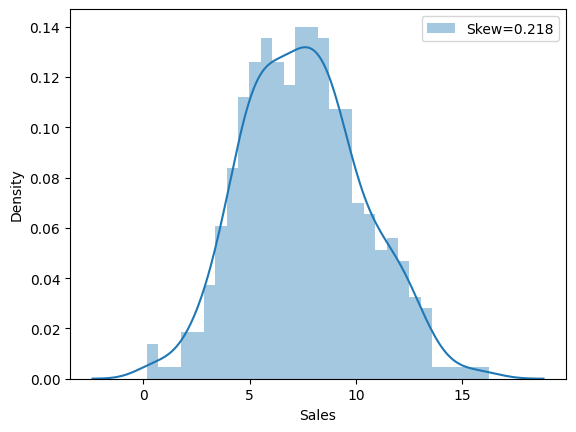

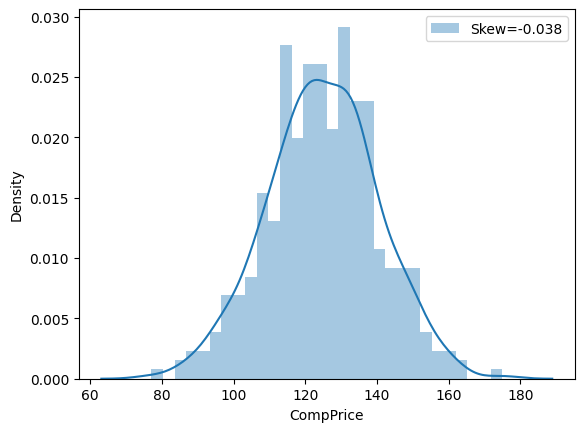

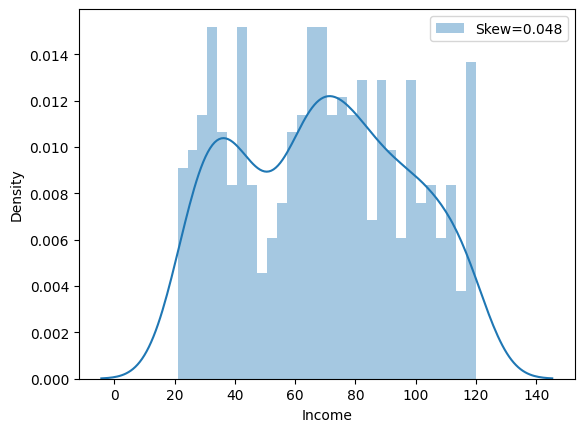

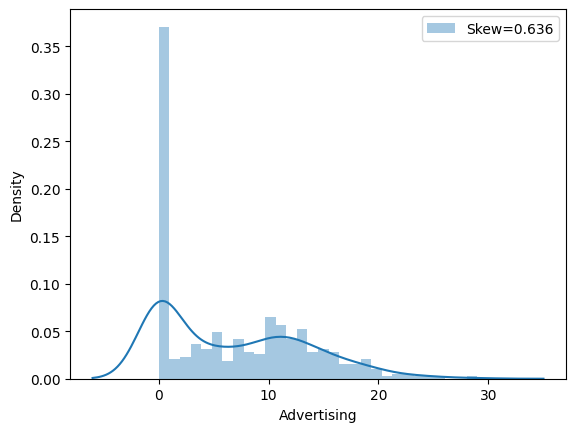

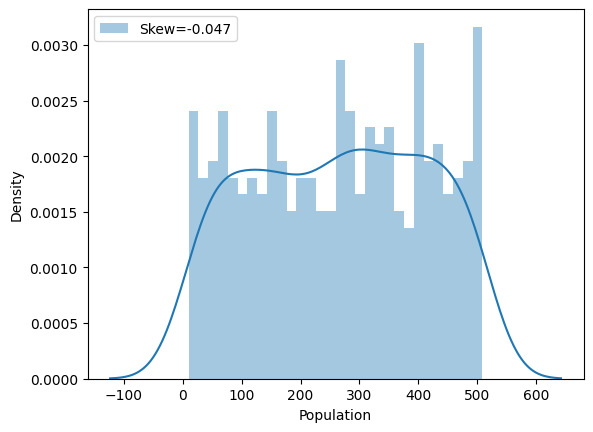

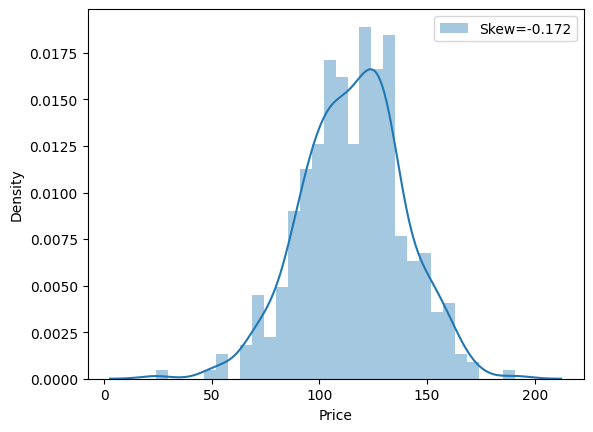

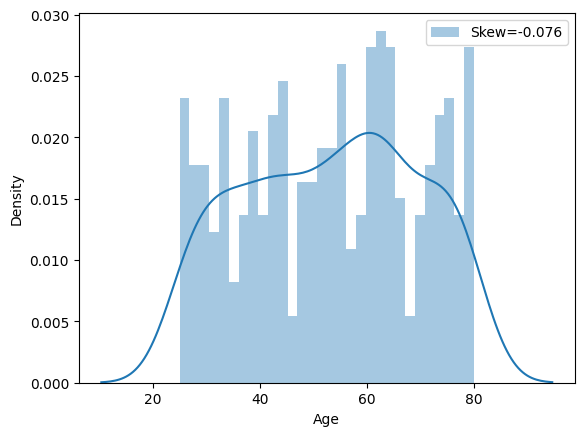

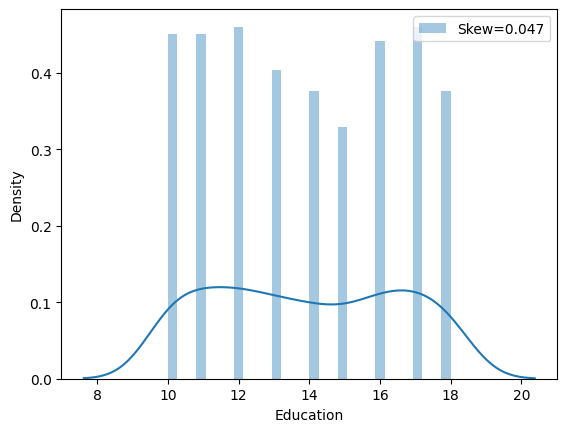

In [15]:
print(num_features)
for i in num_features:
    skew=df[i].skew()
    sn.distplot(df[i],kde=True,label='Skew=%.3f' %skew,bins=30,)
   
    plt.legend(loc='best')
    plt.show()

As we can see in the plots,**Price,CompPrice,sales plots are normally distributed.**

### Find outlier using box-plot

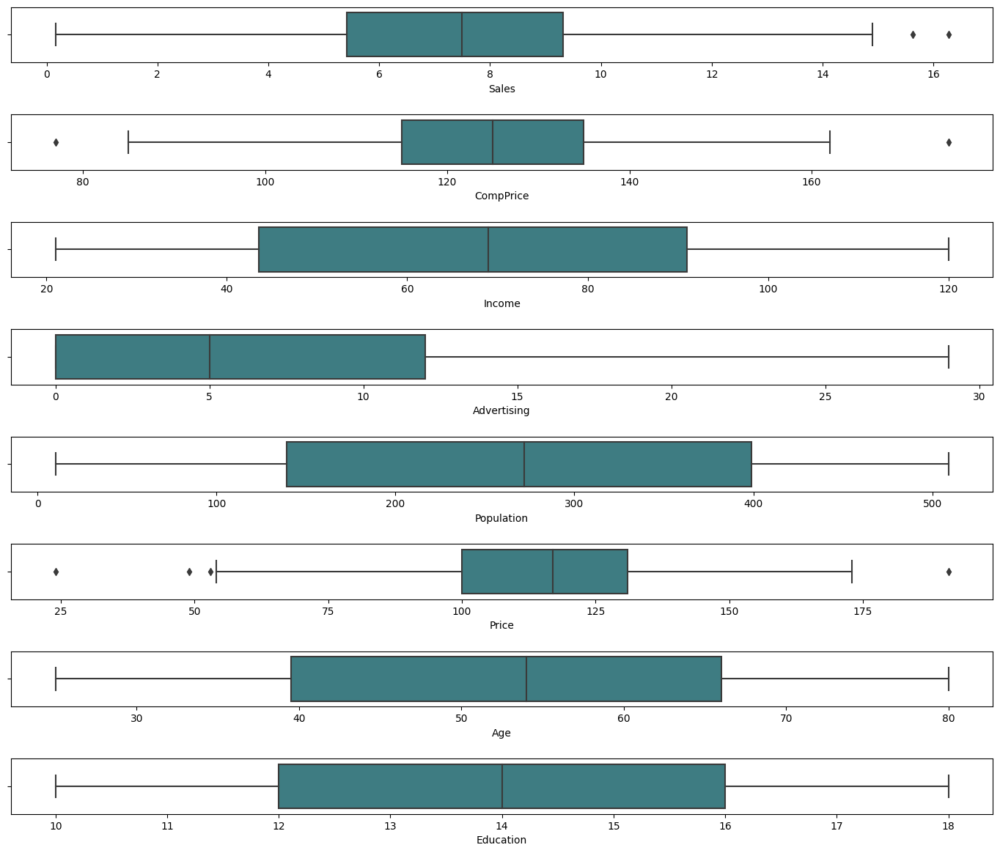

In [16]:
ot=df.copy() 
fig, axes=plt.subplots(8,1,figsize=(14,12))
sn.boxplot(x='Sales',data=ot,palette='crest',ax=axes[0])
sn.boxplot(x='CompPrice',data=ot,palette='crest',ax=axes[1])
sn.boxplot(x='Income',data=ot,palette='crest',ax=axes[2])
sn.boxplot(x='Advertising',data=ot,palette='crest',ax=axes[3])
sn.boxplot(x='Population',data=ot,palette='crest',ax=axes[4])
sn.boxplot(x='Price',data=ot,palette='crest',ax=axes[5])
sn.boxplot(x='Age',data=ot,palette='crest',ax=axes[6])
sn.boxplot(x='Education',data=ot,palette='crest',ax=axes[7])
plt.tight_layout(pad=2)

From the above plot we can say that , there are not more than 2 outlier in columns.
- Sales,Compprice,price have outliers.

### Multivariate Analyis
- **Pairplot**

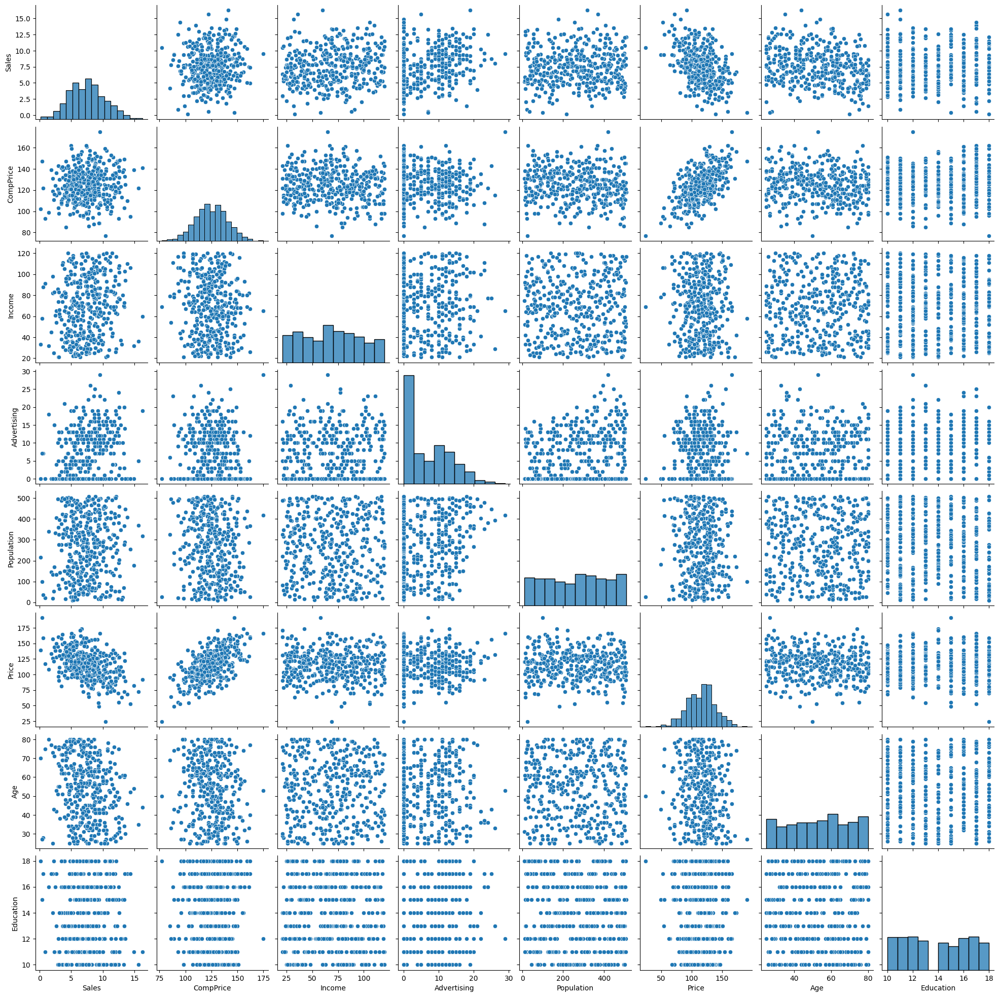

In [17]:
sn.pairplot(df)

<AxesSubplot: >

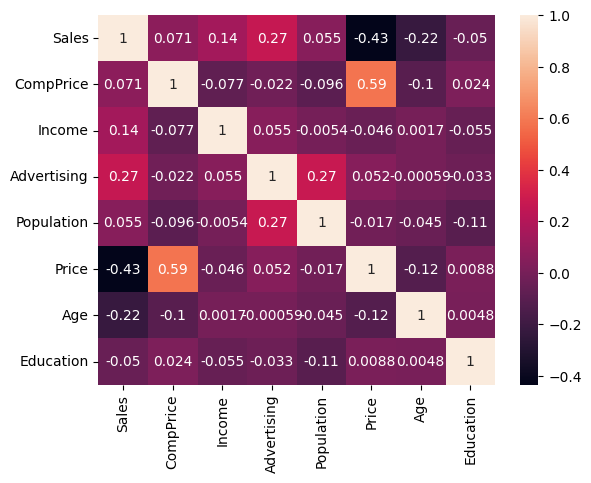

In [18]:
sn.heatmap(data=df.corr(),annot=True,)

In this heat map,all the features are independent to each other.
- There is high multicolinearity between features.

<Figure size 1000x1000 with 0 Axes>

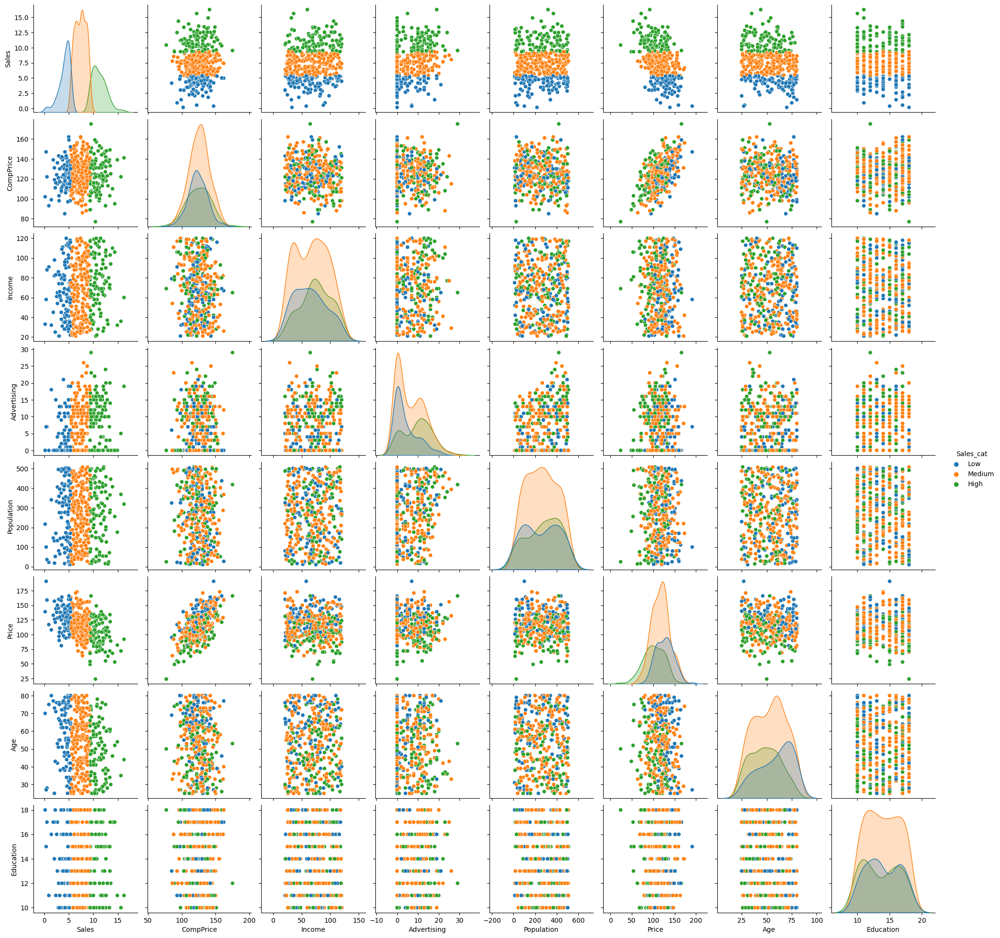

In [19]:
plt.figure(figsize=(10,10))
sn.pairplot(data=df,hue='Sales_cat')

### Now, we can visyualize the categorical features

Index(['ShelveLoc', 'Urban', 'US', 'Sales_cat'], dtype='object')


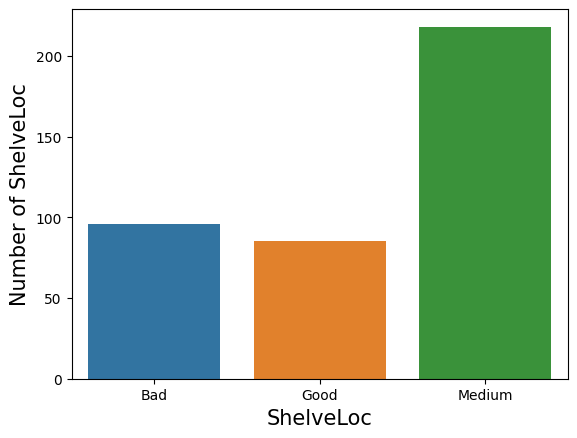

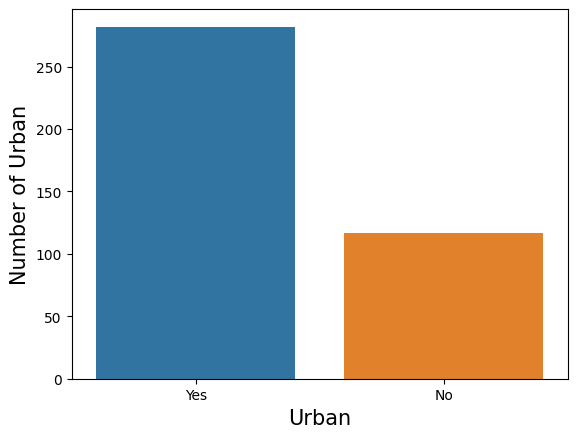

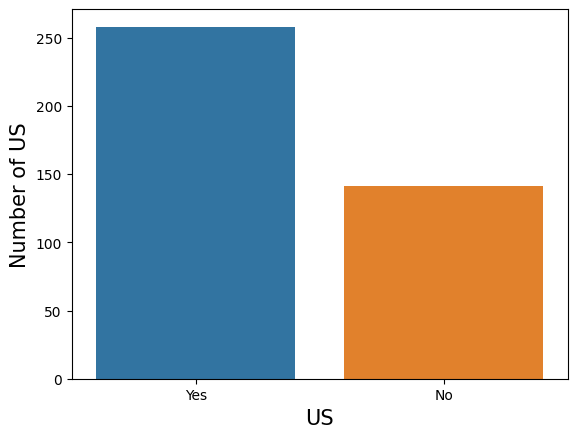

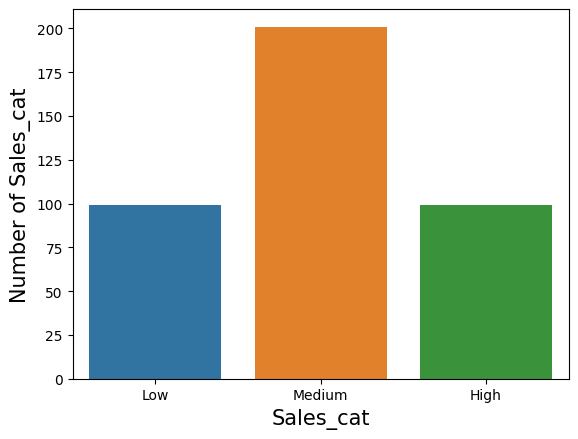

In [20]:
print(cat_features)

for i , column in enumerate (cat_features):
    uniq_count=df[column].value_counts(ascending=False);
    sn.countplot(data=df,x=column)
    plt.xlabel(column,fontsize=15)
    plt.ylabel('Number of '+column,fontsize=15)
    plt.show()


In [21]:
df.Urban.value_counts()

Yes    282
No     117
Name: Urban, dtype: int64

In [22]:
df.US.value_counts()

Yes    258
No     141
Name: US, dtype: int64

In [23]:
df.ShelveLoc.value_counts()

Medium    218
Bad        96
Good       85
Name: ShelveLoc, dtype: int64

In [24]:
df.Sales_cat.value_counts()

Medium    201
Low        99
High       99
Name: Sales_cat, dtype: int64

In [25]:
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US,Sales_cat
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes,High
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes,High
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes,High
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes,Medium
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No,Low
...,...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes,High
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes,Medium
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes,Medium
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes,Medium


In [26]:
# We make copy of dataset for future changes in df1
df1=df.copy()
df1

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US,Sales_cat
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes,High
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes,High
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes,High
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes,Medium
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No,Low
...,...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes,High
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes,Medium
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes,Medium
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes,Medium


In [27]:
#drop the sales column
df1.drop('Sales',axis=1,inplace=True)
df1

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US,Sales_cat
0,138,73,11,276,120,Bad,42,17,Yes,Yes,High
1,111,48,16,260,83,Good,65,10,Yes,Yes,High
2,113,35,10,269,80,Medium,59,12,Yes,Yes,High
3,117,100,4,466,97,Medium,55,14,Yes,Yes,Medium
4,141,64,3,340,128,Bad,38,13,Yes,No,Low
...,...,...,...,...,...,...,...,...,...,...,...
395,138,108,17,203,128,Good,33,14,Yes,Yes,High
396,139,23,3,37,120,Medium,55,11,No,Yes,Medium
397,162,26,12,368,159,Medium,40,18,Yes,Yes,Medium
398,100,79,7,284,95,Bad,50,12,Yes,Yes,Medium


In [30]:
#Label Encodin

from sklearn.preprocessing import LabelEncoder
cols=['ShelveLoc', 'Urban', 'US','Sales_cat']
label_encoder = preprocessing.LabelEncoder()

df1[cols]=df1[cols].apply(label_encoder.fit_transform)


In [31]:
df1

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US,Sales_cat
0,138,73,11,276,120,0,42,17,1,1,0
1,111,48,16,260,83,1,65,10,1,1,0
2,113,35,10,269,80,2,59,12,1,1,0
3,117,100,4,466,97,2,55,14,1,1,2
4,141,64,3,340,128,0,38,13,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...
395,138,108,17,203,128,1,33,14,1,1,0
396,139,23,3,37,120,2,55,11,0,1,2
397,162,26,12,368,159,2,40,18,1,1,2
398,100,79,7,284,95,0,50,12,1,1,2


In [32]:
# Split data
x=df1.iloc[:,1:-1]
y=df1.Sales_cat
x

,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,73,11,276,120,0,42,17,1,1
1,48,16,260,83,1,65,10,1,1
2,35,10,269,80,2,59,12,1,1
3,100,4,466,97,2,55,14,1,1
4,64,3,340,128,0,38,13,1,0
...,...,...,...,...,...,...,...,...,...
395,108,17,203,128,1,33,14,1,1
396,23,3,37,120,2,55,11,0,1
397,26,12,368,159,2,40,18,1,1
398,79,7,284,95,0,50,12,1,1


In [33]:
y.shape

(399,)

In [76]:
# Splitting data into training and testing data set
x_train, x_test,y_train,y_test = train_test_split(x,y, test_size=0.3,random_state=100)
x_train

,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
235,32,8,95,132,2,50,17,1,1
45,63,0,168,135,0,44,12,1,1
171,106,12,416,55,2,75,15,1,1
47,98,0,173,108,0,55,16,1,0
266,93,12,343,112,1,73,17,0,1
...,...,...,...,...,...,...,...,...,...
344,80,0,108,126,1,70,13,0,1
360,86,7,265,114,1,52,15,0,1
324,65,4,133,150,0,53,13,1,1
281,69,7,303,105,1,45,16,0,1


In [77]:
print('Shape of X_train: ',x_train.shape)
print('Shape of y_train: ',y_train.shape)
print('Shape of X_test: ',x_test.shape)
print('Shape of y_test: ',y_test.shape)

Shape of X_train:  (279, 9)
Shape of y_train:  (279,)
Shape of X_test:  (120, 9)
Shape of y_test:  (120,)


In [78]:
# Building Decision Tree Classifier using Entropy Criteria
model = DecisionTreeClassifier(criterion = 'entropy',max_depth=4)
model.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=4)

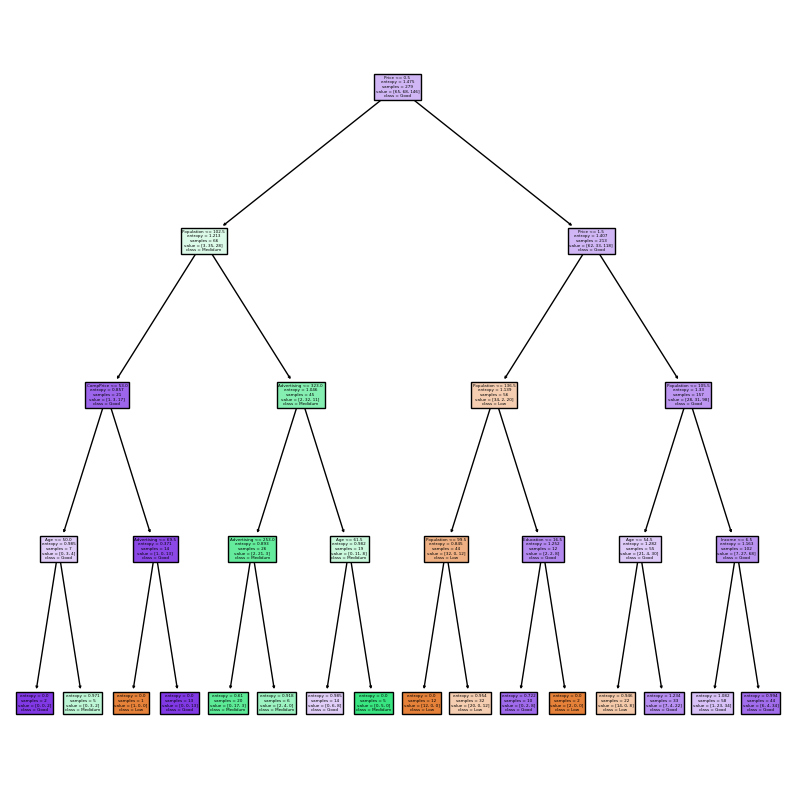

In [79]:
#PLot the decision tree
plt.figure(figsize=(10,10))
features=['CompPrice', 'Income', 'Advertising', 'Population', 'Price',
       'Age', 'Education', 'ShelveLoc', 'Urban', 'US']
cn=['Low','Medidum','Good']
tree.plot_tree(model,
              feature_names=features,
              class_names=cn,filled=True);



In [80]:
#Predicting on test data
preds = model.predict(x_test) # predicting on test data set 
pred_t=model.predict(x_train)
print('Test data Accuracy is:',np.mean(preds==y_test)*100)
print('Train data Accuracy is:',np.mean(pred_t==y_train)*100)


Test data Accuracy is: 66.66666666666666
Train data Accuracy is: 71.32616487455196


In [81]:
model1 = DecisionTreeClassifier(criterion = 'entropy',max_depth=6)
model1.fit(x_train,y_train)
print(model1)
#Predicting on test data
pred_test1 = model1.predict(x_test)
#Accuracy on test data
print('Test data Accuracy is:',np.mean(pred_test1==y_test)*100)
#Predicting on train data
pred_train1 = model1.predict(x_train)
#Accuracy on train data
print('Train data Accuracy is:',np.mean(pred_train1==y_train)*100)

DecisionTreeClassifier(criterion='entropy', max_depth=6)
Test data Accuracy is: 70.0
Train data Accuracy is: 84.22939068100358


In [82]:
model2 = DecisionTreeClassifier(criterion = 'entropy',max_depth=7)
model2.fit(x_train,y_train)
print(model2)
#Predicting on test data
pred_test2 = model2.predict(x_test)
#Accuracy on test data
print('Test data Accuracy is:',np.mean(pred_test2==y_test)*100)
#Predicting on train data
pred_train2 = model1.predict(x_train)
#Accuracy on train data
print('Train data Accuracy is:',np.mean(pred_train2==y_train)*100)

DecisionTreeClassifier(criterion='entropy', max_depth=7)
Test data Accuracy is: 58.333333333333336
Train data Accuracy is: 84.22939068100358


In [83]:
model3 = DecisionTreeClassifier(criterion = 'entropy',max_depth=8)
model3.fit(x_train,y_train)

#Predicting on test data
pred_test3 = model3.predict(x_test)
#Accuracy on test data
print('Test data Accuracy is:',np.mean(pred_test3==y_test)*100)
#Predicting on train data
pred_train3 = model3.predict(x_train)
#Accuracy on train data
print('Train data Accuracy is:',np.mean(pred_train3==y_train)*100)


Test data Accuracy is: 58.333333333333336
Train data Accuracy is: 94.98207885304659


              precision    recall  f1-score   support

           0       0.81      0.74      0.77        34
           1       0.69      0.58      0.63        31
           2       0.65      0.75      0.69        55

    accuracy                           0.70       120
   macro avg       0.72      0.69      0.70       120
weighted avg       0.71      0.70      0.70       120



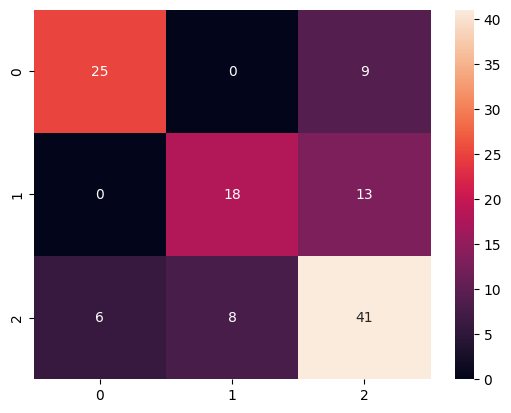

In [113]:
from sklearn.metrics import confusion_matrix
sn.heatmap(confusion_matrix(y_test, pred_test1),annot=True)
print(classification_report(y_test,pred_test1))
 

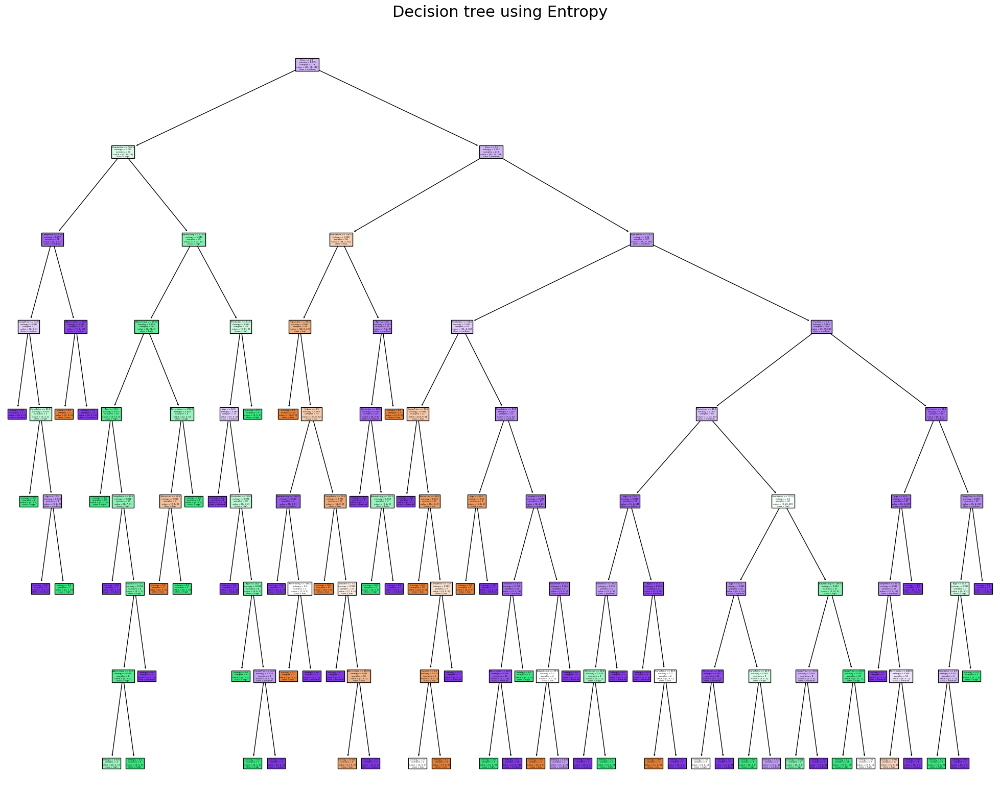

In [85]:
fig = plt.figure(figsize=(25,20))
fig = tree.plot_tree(model1,
 feature_names= ['CompPrice','Income','Advertising','Population','Price', 'ShelveLoc', 'Age', 'Education',
 'Urban', 'US'], class_names= ['low', 'high','medium'], filled=True)
plt.title('Decision tree using Entropy',fontsize=22)
plt.savefig('DT_Entropy.pdf')

In [86]:
model_gini1 = DecisionTreeClassifier(criterion='gini', max_depth=4)
model_gini1.fit(x_train,y_train)
#Predicting on test data
pred_testg1 = model_gini1.predict(x_test)
#Accuracy on test data
print('Test data Accuracy is:',np.mean(pred_testg1==y_test)*100)
#Predicting on train data
pred_traing1 = model_gini1.predict(x_train)
#Accuracy on train data
print('Train data Accuracy is:',np.mean(pred_traing1==y_train)*100)

Test data Accuracy is: 60.0
Train data Accuracy is: 72.75985663082437


In [87]:
model_gini2 = DecisionTreeClassifier(criterion='gini', max_depth=5)
model_gini2.fit(x_train,y_train)
#Predicting on test data
pred_testg2 = model_gini2.predict(x_test)
#Accuracy on test data
print('Test data Accuracy is:',np.mean(pred_testg2==y_test)*100)
#Predicting on train data
pred_traing2 = model_gini2.predict(x_train)
#Accuracy on train data
print('Train data Accuracy is:',np.mean(pred_traing2==y_train)*100)


Test data Accuracy is: 68.33333333333333
Train data Accuracy is: 77.06093189964157


In [88]:
model_gini3 = DecisionTreeClassifier(criterion='gini', max_depth=6)
model_gini3.fit(x_train,y_train)
DecisionTreeClassifier(max_depth=7)
#Predicting on test data
pred_testg3 = model_gini3.predict(x_test)
#Accuracy on test data
print('Test data Accuracy is:',np.mean(pred_testg3==y_test)*100)
#Predicting on train data
pred_traing3 = model_gini3.predict(x_train)
#Accuracy on train data
print('Train data Accuracy is:',np.mean(pred_traing3==y_train)*100)


Test data Accuracy is: 67.5
Train data Accuracy is: 84.22939068100358


              precision    recall  f1-score   support

           0       0.78      0.74      0.76        34
           1       0.66      0.61      0.63        31
           2       0.64      0.69      0.67        55

    accuracy                           0.68       120
   macro avg       0.69      0.68      0.69       120
weighted avg       0.69      0.68      0.68       120



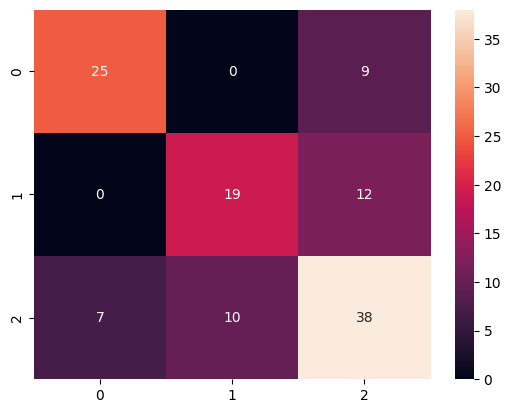

In [111]:
from sklearn.metrics import confusion_matrix
sn.heatmap(confusion_matrix(y_test, pred_testg2),annot=True)
print(classification_report(y_test,pred_testg2))
 

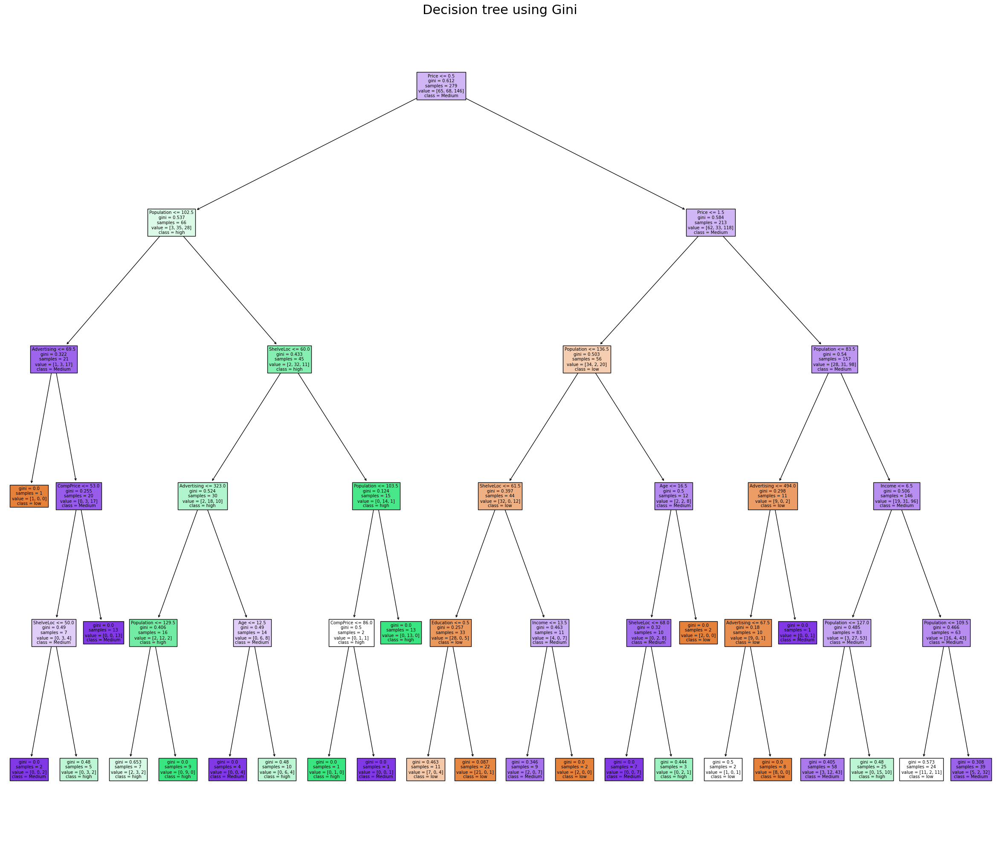

In [112]:
# let's plot the decision tree
fig = plt.figure(figsize=(30,25))
fig = tree.plot_tree(model_gini2,
 feature_names= ['CompPrice','Income','Advertising','Population','Price', 'ShelveLoc', 'Age', 'Education',
 'Urban', 'US'], class_names= ['low', 'high','Medium'], filled=True)
plt.title('Decision tree using Gini',fontsize=22)
plt.savefig('DT_Gini.pdf')

In [91]:
preds = model_gini3.predict(x_test)
pred_t=model_gini3.predict(x_train)
print('Test data: \n',pd.Series(preds).value_counts())
print('Train data: \n',pd.Series(pred_t).value_counts())


Test data: 
 2    67
0    32
1    21
dtype: int64
Train data: 
 2    150
0     67
1     62
dtype: int64


In [92]:
pd.crosstab(y_test,preds)

col_0,0,1,2
Sales_cat,,,
0,22,0,12
1,3,16,12
2,7,5,43


In [93]:
pd.crosstab(y_train,pred_t)

col_0,0,1,2
Sales_cat,,,
0,56,0,9
1,0,53,15
2,11,9,126


In [94]:
np.mean(preds==y_test)*100

67.5

Classification Report                precision    recall  f1-score   support

           0       0.69      0.65      0.67        34
           1       0.76      0.52      0.62        31
           2       0.64      0.78      0.70        55

    accuracy                           0.68       120
   macro avg       0.70      0.65      0.66       120
weighted avg       0.69      0.68      0.67       120



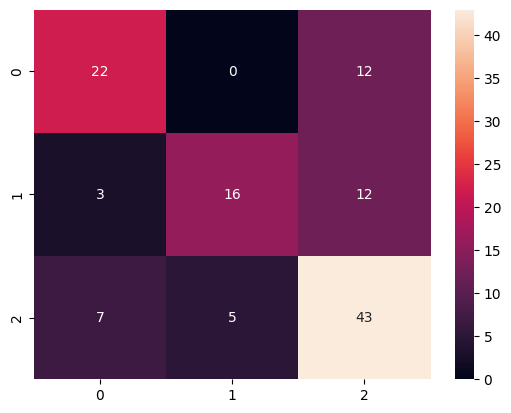

In [95]:
sn.heatmap(confusion_matrix(y_test, preds),annot=True,fmt = "d")
print('Classification Report ',classification_report(y_test,preds))